In [94]:
%matplotlib inline

import os 
import time
import librosa
import IPython
import librosa.display
import importlib
import matplotlib
import numpy as np
import string as strp
import pr_util as util
import matplotlib.pyplot as plt

from scipy import signal, ndimage

importlib.reload(util)

<module 'pr_util' from '/var/tmp/ff/tcc/code/pr_util.py'>

In [95]:
most3 = util.return_n_most_frequent_species(3, 'song')
alldir = util.return_n_most_frequent_species(100, 'song')
e1 = util.return_random_audio([most3[0]])
e2 = util.return_random_audio([most3[1]])
e3 = util.return_random_audio([most3[2]])
print(e1)
print(e2)
print(e3)


['/var/tmp/ff/tcc/dataset/pr_article/S_A_C_Base_Parte-2/Gnorimopsar chopi/song/BLACKBIRD%20Chopi_16_Serrania%20de%20los%20Caracoles_Maldonado_UY_20AGO03_Bernabe%20Lopez-Lanus%20%20SN.mp3', '/var/tmp/ff/tcc/dataset/pr_article/S_A_C_Base_Parte-2/Gnorimopsar chopi/song/BLACKBIRD%20Chopi_16_Serrania%20de%20los%20Caracoles_Maldonado_UY_20AGO03_Bernabe%20Lopez-Lanus%20%20SN.mp3.filtered1.wav', '/var/tmp/ff/tcc/dataset/pr_article/S_A_C_Base_Parte-2/Gnorimopsar chopi/song/BLACKBIRD%20Chopi_16_Serrania%20de%20los%20Caracoles_Maldonado_UY_20AGO03_Bernabe%20Lopez-Lanus%20%20SN.mp3.filtered2.wav', '/var/tmp/ff/tcc/dataset/pr_article/S_A_C_Base_Parte-2/Gnorimopsar chopi/song/BLACKBIRD%20Chopi_16_Serrania%20de%20los%20Caracoles_Maldonado_UY_20AGO03_Bernabe%20Lopez-Lanus%20%20SN.mp3.filtered3.wav', '/var/tmp/ff/tcc/dataset/pr_article/S_A_C_Base_Parte-2/Gnorimopsar chopi/song/BLACKBIRD%20Chopi_16_Serrania%20de%20los%20Caracoles_Maldonado_UY_20AGO03_Bernabe%20Lopez-Lanus%20%20SN.mp3.filtered4.wav', '/v

In [61]:
y1 = []
y2 = []
y3 = []
for (d1, d2, d3) in zip(e1, e2, e3):
    y1.append(librosa.load(d1))
    y2.append(librosa.load(d2))
    y3.append(librosa.load(d3))

#y, sr = librosa.load(most3[0]+'song/mirlo4.alvaricc.mp3')
#y1, sr1 = librosa.load('/Users/felipefelix/USP/tcc/dataset/pr_article/experimentos_100/Vanellus chilensis/song/Vanellus%20chilensis-2.wav.filtered2.wav')
#y2, sr2 = librosa.load('/Users/felipefelix/USP/tcc/dataset/pr_article/experimentos_100/Trogon surrucura/song/10098-2.wav.filtered1.wav')
#y3, sr3 = librosa.load('/Users/felipefelix/USP/tcc/dataset/pr_article/experimentos_100/Vanellus chilensis/song/10047-1.wav.filtered1.wav')


In [92]:
def play_array(ys):
    sinewave = np.sin(np.linspace(0, 800*np.pi, 10000))
    data = sinewave
    
    for y in ys:
        data = np.concatenate((data, y[0], sinewave))
    return data


In [93]:
data = play_array(y1)
IPython.display.Audio(data = data, rate = sr)

In [78]:
IPython.display.Audio(data = y2, rate = sr2)

In [79]:
IPython.display.Audio(data = y3, rate = sr2)

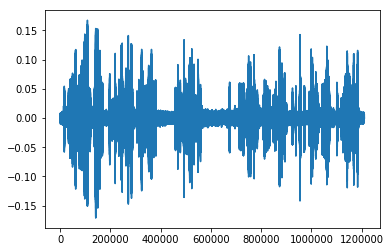

In [40]:
plt.plot(y)

In [43]:
def new_signal_with_energy_threshold(y, size):
    N = len(y)
    energy = y**2
    thres = np.mean(energy)
    new_signal = []
    i = 0
        
    if size > N:
        size = int(N/10)
    
    while i < (N - size):
        if energy[i] > thres:
            new_signal += y[i:i + size].tolist()
            i += size
        else:
            i += 1
    new_signal = np.array(new_signal)
    return new_signal

def new_signal_with_energy_threshold_new(y, size):
    N = len(y)
    energy = y**2
    thres = np.mean(energy)
    new_signal = []
    i = 0
        
    if size > N:
        size = int(N/10)
    
    while i < (N - size):
        if np.mean(energy[i:i+size]) > thres:
            new_signal += y[i:i + size].tolist()
            i += size
        else:
            i += size
    new_signal = np.array(new_signal)
    return new_signal



In [44]:
y_new = new_signal_with_energy_threshold(y, util.time_to_samples(sr=sr, time_sec=0.5))
y_new2 = new_signal_with_energy_threshold_new(y, util.time_to_samples(sr=sr, time_sec=0.5))

#y1_new = new_signal_with_energy_threshold(y1, util.time_to_samples(sr=sr1,time_sec=0.5))
#y2_new = new_signal_with_energy_threshold(y2, util.time_to_samples(sr=sr2,time_sec=0.5))
#y3_new = new_signal_with_energy_threshold(y3, util.time_to_samples(sr=sr3,time_sec=0.5))

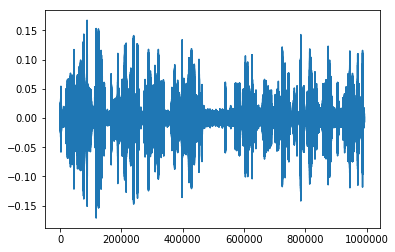

In [45]:
plt.plot(y_new)

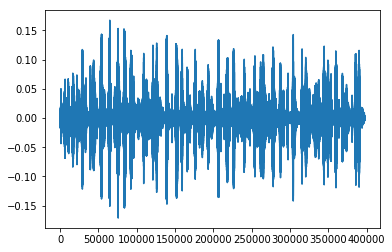

In [46]:
plt.plot(y_new2)

In [30]:
IPython.display.Audio(data = y_new, rate = sr)

In [31]:
IPython.display.Audio(data = y_new2, rate = sr)

In [ ]:
IPython.display.Audio(data = y1_new, rate = sr1)

In [87]:
IPython.display.Audio(data = y2_new, rate = sr2)

In [88]:
IPython.display.Audio(data = y3_new, rate = sr3)

In [99]:
print(util.time_to_samples(0.09287, 22050))
print(util.samples_to_time(n_samples=2048,sr=22050))

2047
0.09287981859410431
